# Rossmann stores - Part II: weather data

In this notebook, we introduce weather features in the data rossman data set. 
We use these features as regressors in propeht

## Importing libraries and loading weather and  Rossmann Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
import datetime
sns.set_style('whitegrid')
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
from prophet import Prophet

In [3]:
from datetime import datetime
from datetime import timedelta

import plotly.graph_objects as go
import plotly.express as px

from metrics import rmse, rmsep,  rmspe
from plot_methods import *


In [4]:
# https://kb.bullseyelocations.com/article/58-germany-state-codes

In [5]:
weather_BW = pd.read_csv("./data/weather/BadenWürttemberg.csv", parse_dates=[0], sep = ';', engine = 'python')
weather_BW['State'] = 'BW'
weather_BY = pd.read_csv("./data/weather/Bayern.csv", parse_dates=[0], sep = ';')
weather_BY['State'] = 'BY'
weather_BE = pd.read_csv("./data/weather/Berlin.csv", parse_dates=[0], sep = ';')
weather_BE['State'] = 'BE'
#weather_BB = pd.read_csv("./data/weather/Brandenburg.csv", parse_dates=[1])
weather_HB = pd.read_csv("./data/weather/Bremen.csv", parse_dates=[0], sep = ';')
weather_HB['State'] = 'HB'
weather_HH = pd.read_csv("./data/weather/Hamburg.csv", parse_dates=[0], sep = ';')
weather_HH['State'] = 'HH'
weather_HE = pd.read_csv("./data/weather/Hessen.csv", parse_dates=[0], sep = ';')
weather_HE['State'] = 'HE'
#weather_MV = pd.read_csv("./data/weather/MecklenburgVorpommern.csv", parse_dates=[1])
weather_NW = pd.read_csv("./data/weather/NordrheinWestfalen.csv", parse_dates=[0], sep = ';')
weather_NW['State'] = 'NW'
weather_RP = pd.read_csv("./data/weather/RheinlandPfalz.csv", parse_dates=[0], sep = ';')
weather_RP['State'] = 'RP'
#weather_SL = pd.read_csv("./data/weather/Saarland.csv", parse_dates=[1])
weather_SN = pd.read_csv("./data/weather/Sachsen.csv", parse_dates=[0], sep = ';')
weather_SN['State'] = 'SN'
weather_ST = pd.read_csv("./data/weather/SachsenAnhalt.csv", parse_dates=[0], sep = ';')
weather_ST['State'] = 'ST'
weather_SH = pd.read_csv("./data/weather/SchleswigHolstein.csv", parse_dates=[0], sep = ';')
weather_SH['State'] = 'SH'
weather_TH = pd.read_csv("./data/weather/Thüringen.csv", parse_dates=[0], sep = ';', engine = 'python')
weather_TH['State'] = 'TH'


In [6]:

weather_combined = pd.concat([weather_BW,weather_BY,weather_BE,weather_HB,weather_HH,weather_HE,
                             weather_NW,weather_RP,weather_SN,weather_ST,weather_SH,weather_TH])
weather_combined.Events = weather_combined.Events.fillna('Normal')
weather_combined = weather_combined[['Date', 'Max_TemperatureC', 'Mean_TemperatureC', 'Min_TemperatureC',
                               'Max_Humidity','Mean_Humidity', 'Min_Humidity', 'Precipitationmm', 'Events','State']]

In [7]:
print("In total: ", weather_combined.shape)
weather_combined.head()

In total:  (11880, 10)


,Date,Max_TemperatureC,Mean_TemperatureC,Min_TemperatureC,Max_Humidity,Mean_Humidity,Min_Humidity,Precipitationmm,Events,State
0,2013-01-01,8,3,-2,93,80,51,0.25,Fog-Rain,BW
1,2013-01-02,6,3,-1,93,77,52,0.00,Rain,BW
2,2013-01-03,6,2,-3,93,82,63,2.03,Rain,BW
3,2013-01-04,9,7,4,100,89,81,0.25,Rain,BW
4,2013-01-05,7,6,5,93,83,72,0.76,Rain,BW


In [8]:
weather_combined.to_csv('weather_combined.csv')

In [9]:
print("Time Frame")
min_date, max_date = weather_combined.Date.min(), weather_combined.Date.max()
range_date = max_date - min_date
print(min_date, max_date, "   Total of: ", range_date)

Time Frame
2013-01-01 00:00:00 2015-09-17 00:00:00    Total of:  989 days 00:00:00


 ## Prepare weather data

<b> Events </b>

In [10]:
weather_combined['Events'].describe()

count     11880
unique       22
top        Rain
freq       4615
Name: Events, dtype: object

- There are 22 types of events, we have to encoded them to use them later as regressors in prophet.

- We will order the events by intensity  and assign an integer, then normalize the array. 

In [11]:
weather_combined['Events'] = weather_combined['Events'].replace({ 'Normal':1,  'Fog':2,'Rain':3, 'Fog-Rain':4, 'Snow':5,
                                                                   'Fog-Snow':6,'Snow-Hail':7, 'Rain-Snow':8,  'Fog-Rain-Snow':9, 'Rain-Snow-Hail':10,
                                                                   'Rain-Hail':11, 'Fog-Rain-Hail':12,'Fog-Snow-Hail':13, 'Fog-Rain-Snow-Hail':14, 'Rain-Thunderstorm':15,
                                                                   'Thunderstorm':16,  'Fog-Thunderstorm':17, 'Fog-Rain-Thunderstorm':18, 'Rain-Hail-Thunderstorm':19,
                                                                   'Rain-Snow-Thunderstorm':20,
                                                                   'Fog-Rain-Hail-Thunderstorm':21,
                                                                   'Rain-Snow-Hail-Thunderstorm':22})

norm = len(weather_combined['Events'].unique())
weather_combined['Events'] = weather_combined['Events'].apply(lambda x : x/norm)

In [12]:
weather_combined.head()

,Date,Max_TemperatureC,Mean_TemperatureC,Min_TemperatureC,Max_Humidity,Mean_Humidity,Min_Humidity,Precipitationmm,Events,State
0,2013-01-01,8,3,-2,93,80,51,0.25,0.181818,BW
1,2013-01-02,6,3,-1,93,77,52,0.00,0.136364,BW
2,2013-01-03,6,2,-3,93,82,63,2.03,0.136364,BW
3,2013-01-04,9,7,4,100,89,81,0.25,0.136364,BW
4,2013-01-05,7,6,5,93,83,72,0.76,0.136364,BW


<b>Precipitation</b>

In [13]:
weather_combined['Precipitationmm'].describe()

count    11880.000000
mean         0.852529
std          2.619129
min          0.000000
25%          0.000000
50%          0.000000
75%          0.250000
max         58.930000
Name: Precipitationmm, dtype: float64

In [14]:
# change precipittion to 01
# If precipitation < 0.5 precipitation = 0
# else precipitation   = 1
# 'Precipitationmm'

weather_combined['Precipitationmm'] = weather_combined['Precipitationmm'].map(lambda x : 1 if x > 0.5 else 0 )

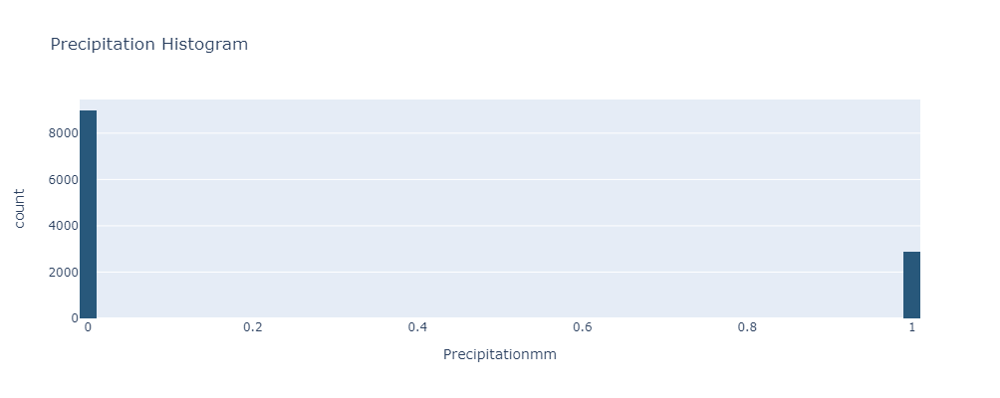

In [15]:
def plot_single_distribution(df,feature,title_):
    
    fig = go.Figure(data=[go.Histogram(x=weather_combined[feature], 
                                   nbinsx= 100) ])
    fig.update_traces(marker_color='#28587B',
                      name='',
                     showlegend=False,)
    fig.update_layout(xaxis_title = feature,
                  yaxis_title = 'count',
                  title = title_,
                  height = 400)
    return fig

plot_single_distribution(weather_combined,'Precipitationmm', "Precipitation Histogram" )

Quartilte method, k =  1.5
Min:  0.0
Max:  0.0
fraction of outliers in a a total of  11880  is:  0.24393939393939393
fraction of outliers in a a total of  11880  is:  0.24393939393939393


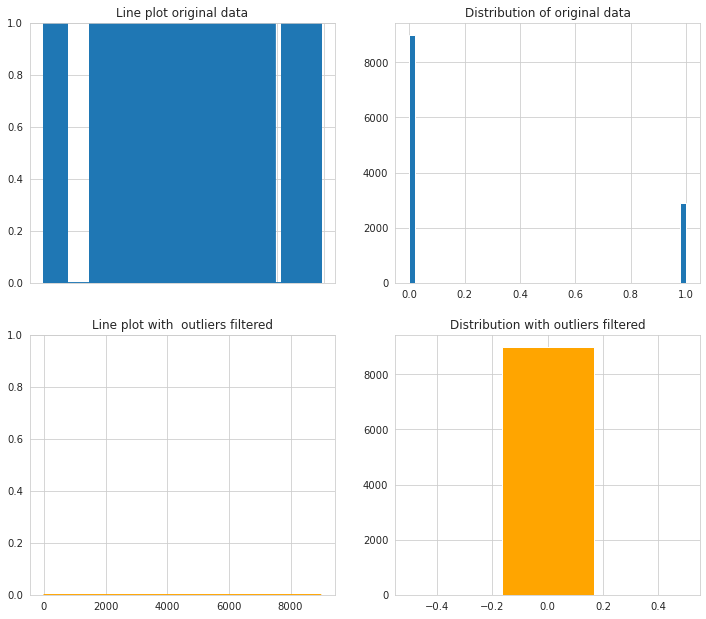

In [16]:
def plot_distr(df,name_col, method):
    X_f = choose_col(df, name_col)
    min_ = min(X_f)[0]
    max_ = max(X_f)[0]
    r, _ , _, _= method(X_f)

    plt.figure(figsize=(12,22))

    #Plot 1
    plt.subplot(4,2,1)
    #Axes.set_ylim(min_, max_)
    plt.plot(X_f)
    plt.ylim(min_, max_)
    plt.title('Line plot original data')
    # plt.xlabel('Week')
    plt.tick_params(labelbottom = False, bottom = False)

    #Plot 2
    plt.subplot(4,2,2)
    plt.hist(X_f, bins = 50)
    plt.title('Distribution of original data')
    #plt.tick_params(left = False, right = False , labelleft = False ,
    #                labelbottom = False, bottom = False)

    # LOF Detection for outliers
    plt.subplot(4,2,3)
    
    plt.plot(r, color = 'orange')
    plt.ylim(min_, max_)
    plt.title("Line plot with  outliers filtered")
    #plt.tick_params(left = False, right = False , labelleft = False ,
    #                 labelbottom = False, bottom = False)

    plt.subplot(4,2,4)
    #plt.hist(r, bins= 100, color = 'orange', range =[min_, max_])
    plt.hist(r, bins= 3, color = 'orange')
    plt.title("Distribution with outliers filtered")
    #plt.tick_params(left = False, right = False , labelleft = False ,
    #                 labelbottom = False, bottom = False)
    plt.show()


plot_distr(weather_combined, 'Precipitationmm', quartil )

## Merge data 

Merge train and test tables with store table

In [17]:
state = pd.read_csv("./data/store_states.csv")
store = pd.read_csv("./data/store.csv")

In [18]:
store = store.merge(state, on = 'Store', how = 'left')

In [19]:
train = pd.read_csv("./data/train.csv",parse_dates=[2])
#test = pd.read_csv("./data/test.csv",parse_dates=[3])
# merge data with store 
train = pd.merge(train, store, on='Store')
#test = pd.merge(test, store, on='Store')

In [20]:
train = train.sort_values(['Date'],ascending = False)
train_full = train.copy()

In [23]:
split_index = 6*7*1115
valid = train[:split_index] 
train = train[split_index:]

In [24]:
#valid = valid[(valid.Open != 0)&(valid.Sales >0)]
valid = valid.merge(weather_combined, on = ['Date','State'],  how = 'left', suffixes=(False,False))
#train = train[(train.Open != 0)&(train.Sales >0)]
train = train.merge(weather_combined, on = ['Date','State'],  how = 'left', suffixes = (False, False))
#train_full = train_full[(train_full.Open != 0)&(train_full.Sales >0)]

Merge stores data with weather data

In [21]:
train_full = train_full.merge(weather_combined, on = ['Date','State'],  how = 'left', suffixes=(False, False))
train_full

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,...,PromoInterval,State,Max_TemperatureC,Mean_TemperatureC,Min_TemperatureC,Max_Humidity,Mean_Humidity,Min_Humidity,Precipitationmm,Events
0,1,5,2015-07-31,5263,555,1,1,0,1,c,...,NaN,HE,23.0,16.0,8.0,98.0,54.0,18.0,0.0,0.090909
1,747,5,2015-07-31,10708,826,1,1,0,1,c,...,NaN,ST,19.0,14.0,9.0,86.0,55.0,27.0,0.0,0.045455
2,772,5,2015-07-31,5224,635,1,1,0,1,d,...,NaN,HH,17.0,13.0,8.0,100.0,70.0,35.0,0.0,0.136364
3,752,5,2015-07-31,7763,565,1,1,0,1,a,...,"Feb,May,Aug,Nov",NW,21.0,13.0,6.0,100.0,61.0,24.0,0.0,0.090909
4,20,5,2015-07-31,9593,974,1,1,0,0,d,...,"Jan,Apr,Jul,Oct",BY,23.0,17.0,10.0,87.0,50.0,27.0,0.0,0.045455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017204,260,2,2013-01-01,0,0,0,0,a,1,a,...,NaN,BE,8.0,7.0,5.0,100.0,78.0,62.0,1.0,0.136364
1017205,995,2,2013-01-01,0,0,0,0,a,1,d,...,NaN,SN,7.0,5.0,3.0,81.0,68.0,46.0,0.0,0.136364
1017206,261,2,2013-01-01,0,0,0,0,a,1,d,...,"Jan,Apr,Jul,Oct",TH,7.0,4.0,2.0,93.0,74.0,55.0,0.0,0.136364
1017207,262,2,2013-01-01,17267,2875,1,0,a,1,b,...,NaN,HH,8.0,6.0,4.0,100.0,92.0,70.0,1.0,0.136364


In [26]:
train_test_merged = pd.concat([train_full.sort_values('Date'), test.sort_values('Date')], axis = 0)

NameError: name 'test' is not defined

In [24]:
train_test_merged

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,...,State,Max_TemperatureC,Mean_TemperatureC,Min_TemperatureC,Max_Humidity,Mean_Humidity,Min_Humidity,Precipitationmm,Events,Id
1017208,1115,2,2013-01-01,0.0,0.0,0.0,0,a,1,d,...,HE,8.0,6.0,3.0,93.0,80.0,59.0,1.0,0.136364,NaN
1016473,261,2,2013-01-01,0.0,0.0,0.0,0,a,1,d,...,TH,7.0,4.0,2.0,93.0,74.0,55.0,0.0,0.136364,NaN
1016472,995,2,2013-01-01,0.0,0.0,0.0,0,a,1,d,...,SN,7.0,5.0,3.0,81.0,68.0,46.0,0.0,0.136364,NaN
1016471,260,2,2013-01-01,0.0,0.0,0.0,0,a,1,a,...,BE,8.0,7.0,5.0,100.0,78.0,62.0,1.0,0.136364,NaN
1016470,259,2,2013-01-01,6851.0,1444.0,1.0,0,a,1,b,...,HE,8.0,6.0,3.0,93.0,80.0,59.0,1.0,0.136364,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,732,4,2015-09-17,NaN,NaN,1.0,1,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,567.0
565,731,4,2015-09-17,NaN,NaN,1.0,1,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,566.0
564,729,4,2015-09-17,NaN,NaN,1.0,1,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,565.0
562,727,4,2015-09-17,NaN,NaN,1.0,1,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,563.0


In [30]:
#test = test.merge(weather_combined, on = ['Date','State'],  how = 'left', suffixes=(False, False))

In [22]:
train_full['Year']  = train_full['Date'].dt.year
train_full['Month'] = train_full['Date'].dt.month
train_full['WeekOfYear'] = train_full['Date'].dt.weekofyear

In [23]:
train_full['Promo2OpenInMonths'] = 12 * (train_full.Year - train_full.Promo2SinceYear) +\
                                    (train_full.WeekOfYear - train_full.Promo2SinceWeek) / 4.0
train_full['Promo2OpenInMonths'] = train_full['Promo2OpenInMonths'].apply(lambda x:x if x>0 else 0)
month_dict = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', \
             7:'Jul', 8:'Aug', 9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}
train_full['month_str'] = train_full.Month.map(month_dict)

In [33]:
def check_promo_month(row):
    '''Indicate whether the month is in promo interval'''
    if isinstance(row['PromoInterval'],str) and (row['month_str'] in row['PromoInterval']) \
    and (row['Promo2OpenInMonths']>0):
        return 1
    else:
        return 0

In [34]:
train_full['IsPromoMonth'] =  train_full.apply(lambda row: check_promo_month(row),axis=1) 

train_full['CompetitionOpenInMonths'] = 12 * (train_full.Year - train_full.CompetitionOpenSinceYear) + \
        (train_full.Month - train_full.CompetitionOpenSinceMonth)
train_full['CompetitionOpenInMonths'] = train_full['CompetitionOpenInMonths'].apply(lambda x: x if x > 0 else 0)

In [105]:
train_full.to_csv('merged_weather.csv')

# Taste of EDA

## Correlation

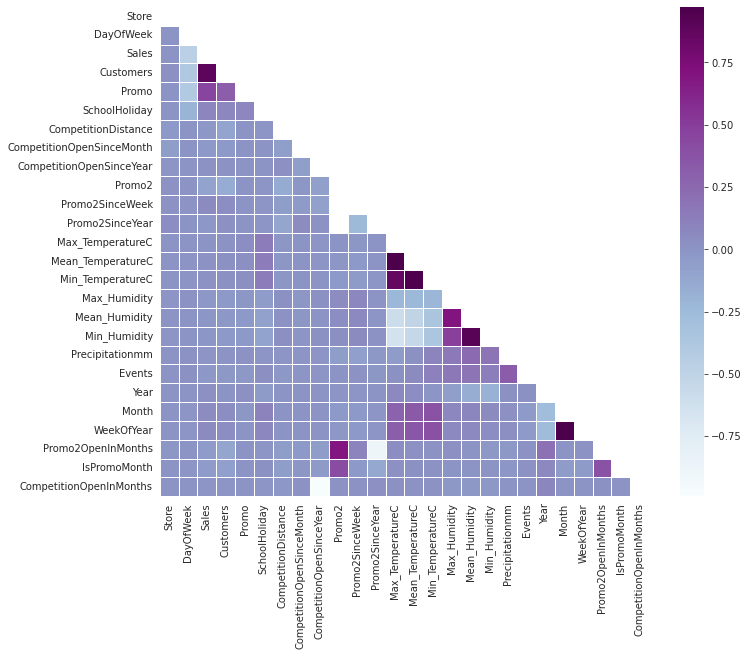

In [35]:
# Compute the correlation matrix 
# exclude 'Open' variable
corr_all = train_full.drop('Open', axis = 1).corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr_all, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize = (11, 9))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_all, mask = mask,
            square = True, linewidths = .5, ax = ax, cmap = "BuPu")      
plt.show()

## Sales

KeyError: 'State'

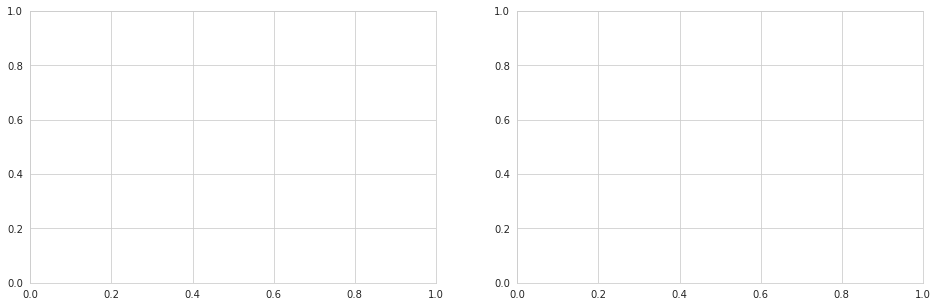

In [36]:
#States
mask = train_full['Sales']>0

fig, (ax1,ax2) = plt.subplots(1,2,figsize=(16,5))
width = 0.2
train_vals = train_full.groupby('State')['Store'].nunique()
indices = np.arange(len(train_vals))
test_vals = test.groupby('State')['Store'].nunique()
test_vals_updated = []
for ind in train_vals.index:
    if ind in test_vals.index:
        test_vals_updated.append(test_vals[ind])
    else:
        test_vals_updated.append(0)
ax1.bar(indices-width, train_vals.values , label = 'Train Data', width = 2*width, color = 'c', align = 'center')
ax1.bar(indices+width, test_vals_updated, label = 'Test Data', width = 2*width, color = 'y')
ax1.set_title('Statewise number of stores in train and test data')
ax1.set_xticks(indices)
ax1.set_xticklabels(train_vals.index, rotation='vertical')
ax1.set_ylabel('Number of stores')
ax1.set_xlabel('States')
ax1.legend()

sns.boxplot(data = train_full[mask], x='State', y='Sales', ax=ax2)
ax2.set_title('Boxplot of statewise sales')
ax2.set_xlabel('States')
plt.show()

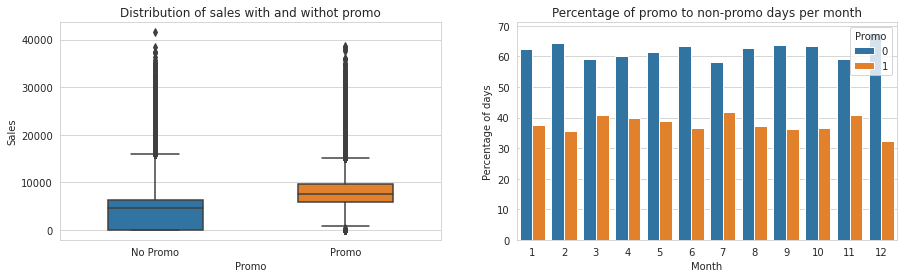

In [37]:
#https://stackoverflow.com/questions/34615854/seaborn-countplot-with-normalized-y-axis-per-group
# Plot average sales & customers with/without promo
fig, (axis1,axis2) = plt.subplots(1,2,figsize=(15,4))
sns.boxplot(x='Promo', y='Sales', data=train, ax=axis1, width=0.5)
axis1.set_xticks([0,1])
axis1.set_xticklabels(['No Promo', 'Promo'])
axis1.set_title('Distribution of sales with and withot promo')

promo_month = (train_full.groupby(['Month'])['Promo']
                     .value_counts(normalize=True)
                     .rename('Percentage of days')
                     .mul(100)
                     .reset_index()
                     .sort_values('Month'))
sns.barplot(x="Month", y="Percentage of days", hue="Promo", data=promo_month, ax = axis2)
axis2.set_title('Percentage of promo to non-promo days per month')
plt.show()

## Competition Distance

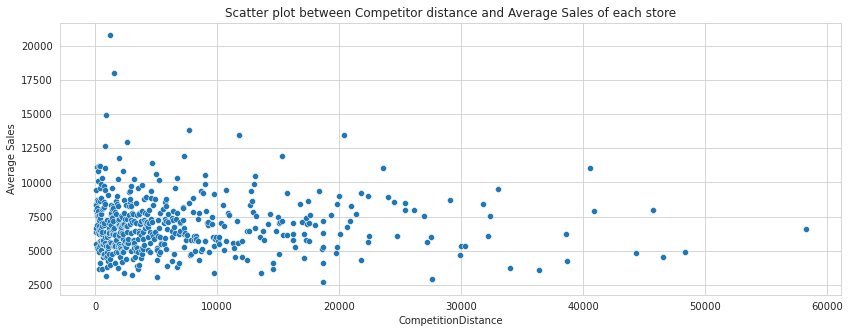

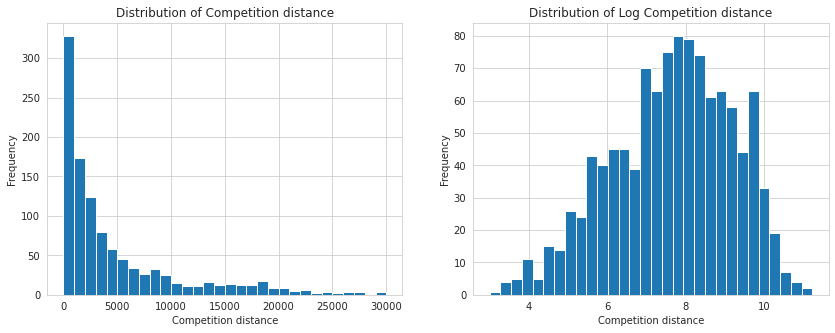

In [38]:
# CompetitionDistance
fig, axis1 = plt.subplots(1,1,figsize=(14,5))
fig, (axis2,axis3) = plt.subplots(1,2,figsize=(14,5))

# Plot CompetitionDistance Vs Sales
comp_df = train_full[(train_full['Sales']>0)&(~train_full['CompetitionDistance'].isna())&\
                    (train_full.CompetitionOpenInMonths>0)].groupby('CompetitionDistance')['Sales'].mean()
sns.scatterplot(x=comp_df.index,y=comp_df.values, ax = axis1)
axis1.set_ylabel('Average Sales')
axis1.set_title('Scatter plot between Competitor distance and Average Sales of each store')
axis2.hist(x = store['CompetitionDistance'].dropna(), bins = 30, range=(0,30000))
axis2.set_ylabel('Frequency')
axis2.set_xlabel('Competition distance')
axis2.set_title('Distribution of Competition distance')
axis3.hist(x = np.log(store['CompetitionDistance'].dropna()), bins = 30)
axis3.set_ylabel('Frequency')
axis3.set_xlabel('Competition distance')
axis3.set_title('Distribution of Log Competition distance')
plt.show()

# Prediction with prophet

In [39]:
train_full['SalePerCustomer'] = train_full['Sales']/train_full['Customers']

In [29]:
train_full

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,...,Max_Humidity,Mean_Humidity,Min_Humidity,Precipitationmm,Events,Year,Month,WeekOfYear,Promo2OpenInMonths,month_str
0,1,5,2015-07-31,5263,555,1,1,0,1,c,...,98.0,54.0,18.0,0.0,0.090909,2015,7,31,0.00,Jul
1,747,5,2015-07-31,10708,826,1,1,0,1,c,...,86.0,55.0,27.0,0.0,0.045455,2015,7,31,0.00,Jul
2,772,5,2015-07-31,5224,635,1,1,0,1,d,...,100.0,70.0,35.0,0.0,0.136364,2015,7,31,0.00,Jul
3,752,5,2015-07-31,7763,565,1,1,0,1,a,...,100.0,61.0,24.0,0.0,0.090909,2015,7,31,24.00,Jul
4,20,5,2015-07-31,9593,974,1,1,0,0,d,...,87.0,50.0,27.0,0.0,0.045455,2015,7,31,9.75,Jul
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017204,260,2,2013-01-01,0,0,0,0,a,1,a,...,100.0,78.0,62.0,1.0,0.136364,2013,1,1,0.00,Jan
1017205,995,2,2013-01-01,0,0,0,0,a,1,d,...,81.0,68.0,46.0,0.0,0.136364,2013,1,1,0.00,Jan
1017206,261,2,2013-01-01,0,0,0,0,a,1,d,...,93.0,74.0,55.0,0.0,0.136364,2013,1,1,38.50,Jan
1017207,262,2,2013-01-01,17267,2875,1,0,a,1,b,...,100.0,92.0,70.0,1.0,0.136364,2013,1,1,0.00,Jan


## Regular predicitons

In [23]:
df_122 =  train_full[train_full['Store'] == 122]
print("# cero sales: ",  len(df_122[df_122['Sales']==0]) )
df_122 = df_122.loc[:,['Date', 'Sales', 'Mean_TemperatureC']] # Store type A
df_122 = df_122.sort_index(ascending = False)
df_122['Date'] = pd.DatetimeIndex(df_122['Date'])
sales = df_122.rename(columns = {'Date': 'ds', 'Sales': 'y', 'Mean_TemperatureC': 'Mean_TemperatureC'})
sales = sales.fillna(0)
sales

# cero sales:  57


,ds,y,Mean_TemperatureC
1016664,2013-01-01,0,7.0
1015183,2013-01-02,6719,6.0
1014560,2013-01-03,4634,8.0
1013481,2013-01-04,5248,7.0
1012401,2013-01-05,5141,7.0
...,...,...,...
4929,2015-07-27,14461,16.0
4388,2015-07-28,12205,16.0
2446,2015-07-29,11446,14.0
1486,2015-07-30,10576,14.0


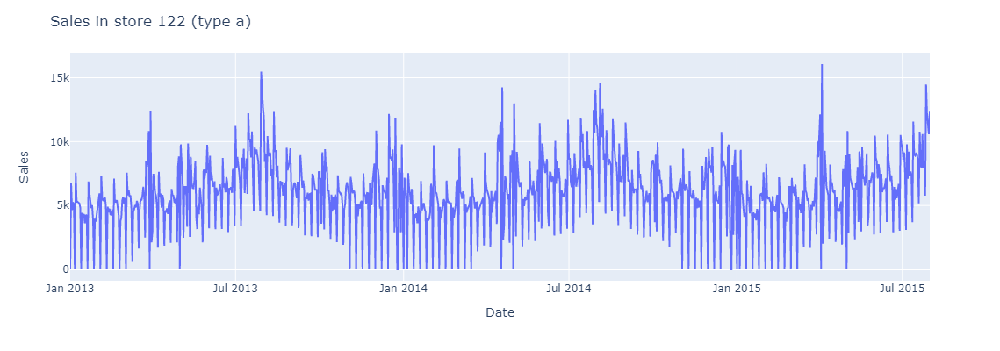

In [38]:
fig = px.line(x=sales['ds'], y=sales['y'])
fig.update_layout(xaxis_title = "Date",
                  yaxis_title = 'Sales',
                  title = " Sales in store 122 (type a)",
                  height = 400)
fig.show()

In [24]:
# Rename 
df = train_full

In [25]:
# create holidays dataframe

state_dates = df[(df.StateHoliday == 'a') | (df.StateHoliday == 'b') & (df.StateHoliday == 'c')].loc[:, 'Date'].values
school_dates = df[df.SchoolHoliday == 1].loc[:, 'Date'].values

state = pd.DataFrame({'holiday': 'state_holiday',
                      'ds': pd.to_datetime(state_dates)})
school = pd.DataFrame({'holiday': 'school_holiday',
                      'ds': pd.to_datetime(school_dates)})

holidays = pd.concat((state, school))      
holidays

,holiday,ds
0,state_holiday,2015-06-04
1,state_holiday,2015-06-04
2,state_holiday,2015-06-04
3,state_holiday,2015-06-04
4,state_holiday,2015-06-04
...,...,...
181716,school_holiday,2013-01-01
181717,school_holiday,2013-01-01
181718,school_holiday,2013-01-01
181719,school_holiday,2013-01-01


In [44]:
# set the uncertainty interval to 95% (the Prophet default is 80%)
my_model = Prophet(interval_width = 0.95, 
                         holidays = holidays)
my_model.fit(sales)

# dataframe that extends into future 6 weeks 
future_dates = my_model.make_future_dataframe(periods = 6*7)

#print("First week to forecast.")
#future_dates.tail(7)

forecast = my_model.predict(future_dates)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -34.2328
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1763.6     0.0514242        156.06      0.4292           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100        1763.7    0.00131068       230.964   8.399e-06       0.001      140  LS failed, Hessian reset 
     153       1767.02    0.00394746       313.057   2.597e-05       0.001      228  LS failed, Hessian reset 
     199       1768.58   1.69148e-05        86.095      0.4097      0.4097      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       1769.17    0.00601088       225.845   3.805e-05       0.001      410  LS failed, Hessian reset 
     299       1769.54   4.06182e-05       95.2508           1           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

In [47]:
def time_interval(some_df):
    one_year = timedelta(days=365)
    last = len(some_df)

    last = some_df.ds.values[last-1]
    last = pd.to_datetime(last)

    start = last - one_year 
    
    return start, last

In [48]:
def plot_individual_store_prediction(df_forecast, df_sales, store, feature):
    
    start, end = time_interval(df_forecast)

    fig = go.Figure()
    fig.add_trace(go.Scatter(x = df_sales['ds'],   y = df_sales['y']     , name = "actual" ))
    fig.add_trace(go.Scatter(x = df_forecast.ds,   y = df_forecast.yhat  , name = "forecast" ))
    fig.add_trace(go.Scatter(x = df_forecast.ds,   y = df_forecast.yhat_upper , mode = 'lines', line = dict(width = 0), hoverinfo = "skip", showlegend = False, name = "Upper" ))
    fig.add_trace(go.Scatter(x = df_forecast.ds,   y = df_forecast.yhat_lower , mode = 'lines', line = dict(width = 0) , fillcolor= 'rgba(68,68,68, 0.2)', fill = "tonexty", hoverinfo = "skip", showlegend = False, name = "Upper" ))

    fig.update_layout(xaxis_title = "Date",
                      yaxis_title = feature,
                      title = "Forecast: open on sundays - Store no. " + str(store),
                      height = 400,
                      xaxis_range = [start, end]   )

    print("Showing only one year of data")

    return fig

Showing only one year of data


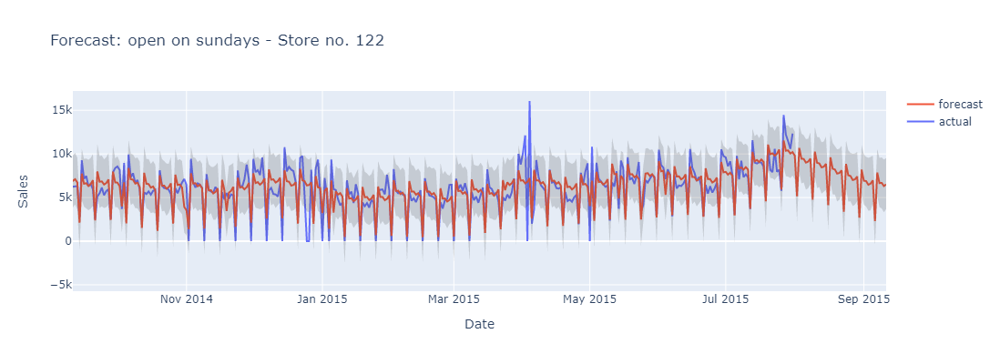

In [49]:
plot_individual_store_prediction(forecast, sales, 122, 'Sales')

## Prediction with regessor

In [196]:
my_model_w = Prophet(interval_width = 0.95, 
                         holidays = holidays)
my_model_w.add_regressor('Mean_TemperatureC')

my_model_w.fit(sales)

# dataframe that extends into future 6 weeks 
future_dates = my_model_w.make_future_dataframe(periods = 6*7)

#print("First week to forecast.")
#future_dates.tail(7)


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -34.2328
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1763.01    0.00318611       105.872           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       1767.96    0.00187781       183.569   1.234e-05       0.001      201  LS failed, Hessian reset 
     199       1769.02   0.000614696       99.6608      0.6597      0.6597      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       1769.51   0.000855333       170.544   5.362e-06       0.001      310  LS failed, Hessian reset 
     299       1769.96    0.00017554       96.6322           1           1      419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       1769.97   4.93433e-07         89.74   5.653e-09       0.001      530  LS failed, Hessian rese

In [197]:
future_dates['Mean_TemperatureC'] = df_122['Mean_TemperatureC']
future_dates['Mean_TemperatureC'] = future_dates['Mean_TemperatureC'].fillna(0)


In [198]:
forecast = my_model_w.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)


Showing only one year of data


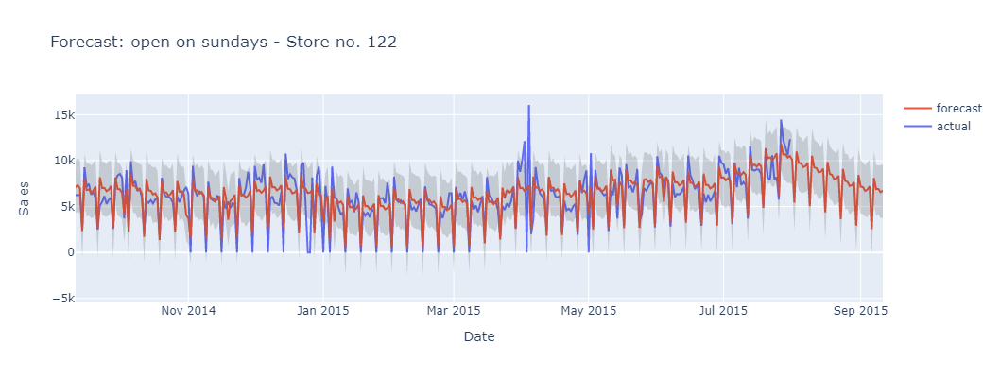

In [199]:
plot_individual_store_prediction(forecast, sales, 122, 'Sales')

In [240]:
rmse( sales['y'], forecast['yhat']), rmsep(sales['y'], forecast['yhat'])

(6668.042129991216, 1.0983431006460047)

In [26]:
def make_individual_prediction(df, feature, n_store, events):
    """ df: dataframe
        n_store: integer that represents a store
        holidays: df with the holydays
        
        returns:
        forecast: df with the forecast produced by prophet
        sales: ts with sales per customer (modified)
        n_store: store number that has been processed
        
    """
    
    this_df = df[df['Store'] == n_store].loc[:,['Date', feature]]
    this_df = this_df.sort_index(ascending = False)
    this_df['Date'] = pd.DatetimeIndex(this_df['Date'])
    print(this_df)
    quit()
    
    sales = this_df.rename(columns = {'Date': 'ds', feature : 'y'})
    sales = sales.fillna(0)
    
    if events == False:
        my_model = Prophet(interval_width = 0.95)
    else:
        my_model = Prophet(interval_width = 0.95, 
                         holidays = holidays)
    my_model.fit(sales)


    # dataframe that extends into future 6 weeks 
    # future_dates = my_model.make_future_dataframe(periods = 6*7)
    future_dates =  pd.DataFrame({'ds': pd.date_range('2013-01-01', '2015-09-25', freq='W-Fri')})

    
    forecast = my_model.predict(future_dates)

    # preditions for last week
    #forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)
    
    print("Finished calculating Forecast for store: " + str(n_store))
    return forecast, sales, n_store, feature


In [27]:
a_test,b_test,c_test,d_test = make_individual_prediction(train_full, 'Sales', 122, events = False)

              Date  Sales
1016664 2013-01-01      0
1015183 2013-01-02   6719
1014560 2013-01-03   4634
1013481 2013-01-04   5248
1012401 2013-01-05   5141
...            ...    ...
4929    2015-07-27  14461
4388    2015-07-28  12205
2446    2015-07-29  11446
1486    2015-07-30  10576
1014    2015-07-31  12336

[942 rows x 2 columns]


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -34.2328
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1715.88   0.000698763       144.484      0.4615      0.4615      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1722.07   9.12438e-05        82.868           1           1      253   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256        1722.6    0.00131377       178.928   9.334e-06       0.001      362  LS failed, Hessian reset 
     299       1722.87   6.49437e-06        93.591           1           1      414   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     323       1722.87   6.43435e-08       81.0763           1           1      442   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Finished calculating Forec

Showing only one year of data


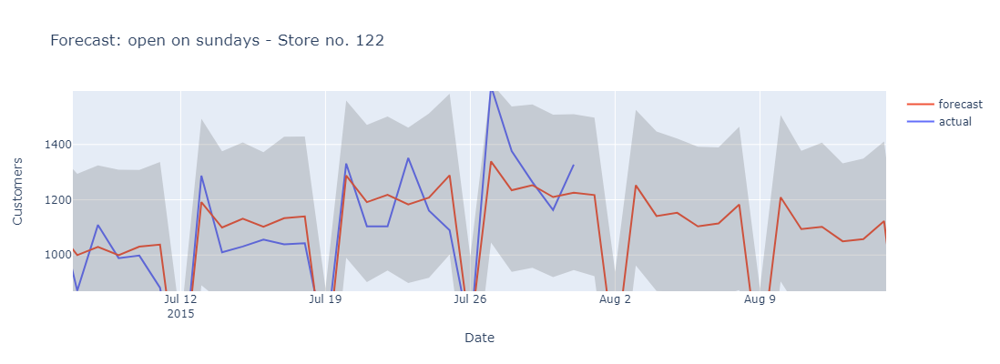

In [124]:
plot_individual_store_prediction(a, b, c, d)

In [125]:
#len(a), len(b)
a = a.drop(a.index[a.index >= len(b)])

print(rmse(  b['y'].array, a['yhat'].array))
print(rmsep( b['y'].array, a['yhat'].array))
print(rmspe( b['y'].array, a['yhat'].array))

148.4245577192218
0.19902737292668848
inf


In [167]:
a_temp, b_temp, c_temp, d_temp, e_temp =  make_individual_prediction_regressor(train_full, "Customers", 122, holidays, "Precipitationmm")

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.2015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99          1830     0.0320388       196.734           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       1833.17    0.00454107       291.975   5.186e-05       0.001      200  LS failed, Hessian reset 
     199        1835.4   0.000315218       75.3984      0.4454     0.04454      278   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1835.87   7.51683e-06       92.5439   9.472e-08       0.001      432  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1835.89   5.61226e-06       67.5257      0.7853      0.2272      567   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     413       1

In [168]:
# metric

#len(b['y']),len(a['yhat'])

a_temp = a_temp.drop(a_temp.index[a_temp.index >= len(b_temp)])


In [169]:
rmse( b_temp['y'].array, a_temp['yhat'].array), rmsep( b_temp['y'].array, a_temp['yhat'].array), rmspe( b_temp['y'].array, a_temp['yhat'].array)


(148.45569253100203, 0.19906912262020554, inf)

Showing only one year of data


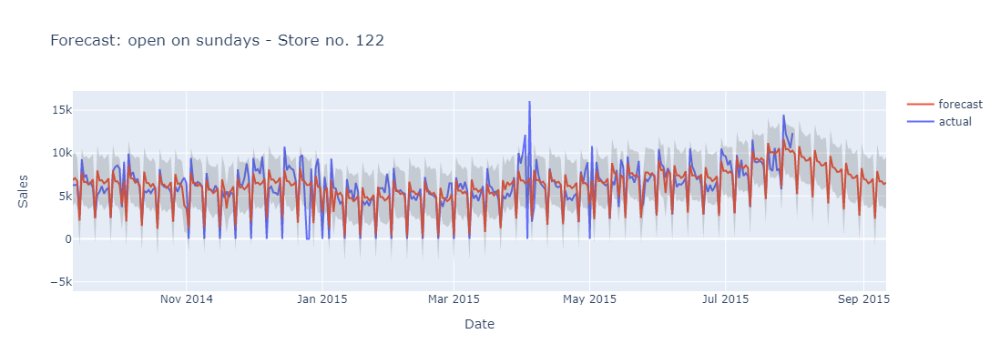

In [247]:
plot_individual_store_prediction(a_temp, b_temp, c_temp, d_temp)

In [ ]:
df[(df['DayOfWeek']==7)&(df['Open']==1)&(df['StoreType']==a)].Store.unique()


In [126]:
# WARNING!!!! tHIS BLOCK TAKES TIME 
# This block performs all predictions for one store 
#[['Date', 'Max_TemperatureC', 'Mean_TemperatureC', 'Min_TemperatureC','Max_Humidity','Mean_Humidity', 'Min_Humidity', 'Precipitationmm', 'Events','State']]

weather_features = ['Mean_TemperatureC','Mean_Humidity', 'Precipitationmm', 'Events']
store = 122
dic_predictions = {}
feature = "Customers"


for store in stores :
    for item in weather_features:
        forecast_, sales_,  _ , _,  w_feat= make_individual_prediction_regressor(df, feature ,  store, holidays, item)
        dic_ = {'store': store, 'forecast': forecast_ ,'sales': sales_ , 'weather_feature': w_feat  }
        dic_predictions[str(item)] = dic_
    
    
    
#print(dic_predictions)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.2015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1828.52    0.00925088       187.258      0.2097           1      112   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       1830.76   0.000944168       192.987   7.679e-06       0.001      165  LS failed, Hessian reset 
     162       1833.26   0.000721866       157.672   3.148e-06       0.001      250  LS failed, Hessian reset 
     199       1834.57     0.0039936       125.331      0.3563           1      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       1835.55    0.00138722       245.145    1.14e-05       0.001      357  LS failed, Hessian reset 
     299       1835.84   2.65319e-07       60.2816      0.9359      0.9359      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 122
feature: Customers
weather: Mean_TemperatureC
Initial log joint probability = -39.2015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1829.74      0.009549       177.604           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       1836.76    0.00159981       117.516   1.432e-05       0.001      252  LS failed, Hessian reset 
     199        1836.9   0.000145261       80.3505      0.3779           1      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       1836.91   1.18085e-07       78.7758           1           1      328   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Finished calculating Forecast for store: 122
feature: Customers
weather: Mean_Humidity


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.2015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1826.98     0.0145611       310.281           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       1834.94   0.000722156       167.977   4.631e-06       0.001      242  LS failed, Hessian reset 
     199       1835.47    0.00230037       119.493           1           1      258   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     265       1835.63   4.71621e-08       69.0191      0.3298           1      345   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Finished calculating Forecast for store: 122
feature: Customers
weather: Precipitationmm


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -39.2015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1832.33     0.0167525       203.594      0.5306           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       1833.87   0.000789095       148.858   5.594e-06       0.001      169  LS failed, Hessian reset 
     199        1838.1    0.00044518       74.6999      0.3367           1      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223        1838.8   0.000617827        152.65   3.578e-06       0.001      349  LS failed, Hessian reset 
     260       1839.15   0.000161018       67.7863     1.8e-06       0.001      437  LS failed, Hessian reset 
     299       1839.16   5.97487e-07       59.2971      0.5476      0.5476      495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

In [106]:
y_ = dic_predictions['Events']['forecast']

In [107]:
actual = dic_predictions['Events']['sales']

In [109]:
y_ =  y_.drop(y_.index[y_.index >= len(actual)])

In [110]:
rmse( actual['y'].array, y_['yhat'].array), rmsep( actual['y'].array, y_['yhat'].array), rmspe( actual['y'].array, y_['yhat'].array)

(1488.9872879712264, 0.24526223482258602, inf)

In [127]:
#a_temp = a_temp.drop(a_temp.index[a_temp.index >= len(b_temp)])

for w in weather_features:
    y_ = dic_predictions[w]['forecast']
    actual = dic_predictions[w]['sales']
    y_ =  y_.drop(y_.index[y_.index >= len(actual)])
    res = rmse( actual['y'].array, y_['yhat'].array)
    res2 = rmsep( actual['y'].array, y_['yhat'].array)
    print(str(w),  "rmse: ", res, res2)


Mean_TemperatureC rmse:  148.59678761119915 0.1992583216555676
Mean_Humidity rmse:  149.5293644923113 0.20050884467919708
Precipitationmm rmse:  148.43196894950233 0.19903731088921675
Events rmse:  148.5391060412105 0.19918097454052447


<!-- Results for feature "Sales", store 122

#no regressor             1488.8822805084085 0.24524493825785923
#Mean_TemperatureC rmse:  1491.628167489056  0.24569723384351294
#Mean_Humidity rmse:      1491.3424363320294 0.2456501689271789
#Precipitationmm rmse:    1489.1383999965162 0.24528712561469054
#Events rmse:             1488.9872879712264 0.24526223482258602

# precipitation(0,1)      1489.010863231162, 0.24526611808000873

In [ ]:
#Results for feature 'SaleperCustomer' store 122

# no regressor                1.693172263947844    0.22291646876633958
# Mean_TemperatureC rmse:     1.695262341253814    0.22319164020779064
# Mean_Humidity rmse:         1.6970701901617413   0.22342965455706815
# Precipitationmm rmse:       1.6951496210673591   0.2231767999068607
# Events rmse:                1.693271381807418    0.22292951823786614

#precipitation (0,1)          1.6953058370281926, 0.22319736669211668

In [ ]:
# Results for feature "customers"

#no regressor no regressor  148.4245577192218    0.19902737292668848
# Mean_TemperatureC rmse:   148.59678761119915   0.1992583216555676
# Mean_Humidity rmse:       149.5293644923113    0.20050884467919708
# Precipitationmm rmse:     148.43196894950233   0.19903731088921675
# Events rmse:              148.5391060412105    0.19918097454052447

# Precipiationmm (0,1)      148.45569253100203, 0.19906912262020554

In [97]:
def make_base_individual_prediction(df, feature, n_store, events):
    """ df: dataframe
        n_store: integer that represents a store
        holidays: df with the holydays
        
        returns:
        forecast: df with the forecast produced by prophet
        sales: ts with sales per customer (modified)
        n_store: store number that has been processed
        
    """
    
    #this_df = df[df['Store'] == n_store].loc[:,['Date', feature]]
    #this_df = this_df.sort_index(ascending = False)
    #this_df['Date'] = pd.DatetimeIndex(this_df['Date'])
    #sales = this_df.rename(columns = {'Date': 'ds', feature : 'y'})
    #sales = sales.fillna(0)
    
    sales_store_N = df[df['Store']== n_store]
    sales_store_N = sales_store_N.set_index('Date')
    sales_store_N_w = sales_store_N.resample('W-Fri').agg({'Sales':np.sum, 'Customers': np.sum})
    #sales_store_N_w['salesPerCustomer'] = sales_store_N_w['Sales']/sales_store_N_w['Customers']
    sales_store_N_w['Date'] = sales_store_N_w.index
    sales = sales_store_N_w.rename(columns = {'Date': 'ds', feature : 'y'})
    sales = sales.fillna(0)
    
    if events == False:
        my_model = Prophet(interval_width = 0.95)
    else:
        my_model = Prophet(interval_width = 0.95, 
                         holidays = holidays)
    my_model.fit(sales)

    # dataframe that extends into future 6 weeks 
    #future_dates = my_model.make_future_dataframe(periods = 6*7)
    
    # dataframe that extends into future 6 weeks 
    #future_dates = my_model.make_future_dataframe(periods = 6)
    future_dates =  pd.DataFrame({'ds': pd.date_range('2013-01-01', '2015-09-25', freq='W-Fri')})


    #print("First week to forecast.")
    #future_dates.tail(7)
    
    forecast = my_model.predict(future_dates)

    # preditions for last week
    #forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)
    
    print("Finished calculating Forecast for store: " + str(n_store))
    return forecast, sales, n_store, feature

In [68]:
train_full

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,...,Precipitationmm,Events,Year,Month,WeekOfYear,Promo2OpenInMonths,month_str,IsPromoMonth,CompetitionOpenInMonths,SalePerCustomer
0,1,5,2015-07-31,5263,555,1,1,0,1,c,...,0.0,0.090909,2015,7,31,0.00,Jul,0,82.0,9.482883
1,747,5,2015-07-31,10708,826,1,1,0,1,c,...,0.0,0.045455,2015,7,31,0.00,Jul,0,83.0,12.963680
2,772,5,2015-07-31,5224,635,1,1,0,1,d,...,0.0,0.136364,2015,7,31,0.00,Jul,0,0.0,8.226772
3,752,5,2015-07-31,7763,565,1,1,0,1,a,...,0.0,0.090909,2015,7,31,24.00,Jul,0,28.0,13.739823
4,20,5,2015-07-31,9593,974,1,1,0,0,d,...,0.0,0.045455,2015,7,31,9.75,Jul,1,74.0,9.849076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1017204,260,2,2013-01-01,0,0,0,0,a,1,a,...,1.0,0.136364,2013,1,1,0.00,Jan,0,15.0,NaN
1017205,995,2,2013-01-01,0,0,0,0,a,1,d,...,0.0,0.136364,2013,1,1,0.00,Jan,0,0.0,NaN
1017206,261,2,2013-01-01,0,0,0,0,a,1,d,...,0.0,0.136364,2013,1,1,38.50,Jan,1,0.0,NaN
1017207,262,2,2013-01-01,17267,2875,1,0,a,1,b,...,1.0,0.136364,2013,1,1,0.00,Jan,0,0.0,6.005913


In [94]:
a,b,c,d =  make_base_individual_prediction(train_full, 'Sales', 122, events= False)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.9943
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       290.705   0.000487294        101.56    0.008293           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     180       291.306   4.65305e-06       99.9949   5.799e-08       0.001      279  LS failed, Hessian reset 
     199       291.306     3.787e-07       82.7162           1           1      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       291.306   3.03604e-09       98.3528     0.02711     0.02711      328   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Finished calculating Forecast for store: 122


In [95]:
len(b['y']),len(a['yhat'])
a_temp = a.drop(a.index[a.index >= len(b)])
rmse( b['y'].array, a_temp['yhat'].array), rmsep( b['y'].array, a_temp['yhat'].array)

(5247.6738436097685, 0.1238766327073519)

In [63]:
b

,Sales,Customers,y,ds
Date,,,,
2013-01-04,20033838,2396743,8.358776,2013-01-04
2013-01-11,49209176,5215408,9.435345,2013-01-11
2013-01-18,34377516,4223130,8.140293,2013-01-18
2013-01-25,46210343,4941390,9.351689,2013-01-25
2013-02-01,37504341,4425698,8.474221,2013-02-01
...,...,...,...,...
2015-07-03,56167940,5454153,10.298197,2015-07-03
2015-07-10,41175737,4660532,8.834986,2015-07-10
2015-07-17,51800088,5233803,9.897218,2015-07-17


In [96]:
def make_individual_prediction_regressor(df, feature, n_store, events, w_feature):
    """ df: dataframe
        n_store: integer that represents a store
        holidays: df with the holydays
        w_feature: one in list
        
        returns:
        forecast: df with the forecast produced by prophet
        sales: ts with sales per customer (modified)
        n_store: store number that has been processed
        w_feature: weather feature
        
    """
    
    # this_df = df[df['Store'] == n_store].loc[:,['Date', feature, w_feature]]
    # this_df = this_df.sort_index(ascending = False)
    # this_df['Date'] = pd.DatetimeIndex(this_df['Date'])
    # sales = this_df.rename(columns = {'Date': 'ds', feature : 'y', w_feature: w_feature})
    # #sales = df_122.rename(columns = {'Date': 'ds', 'Sales': 'y', 'Mean_TemperatureC': 'Mean_TemperatureC'})
    # sales = sales.fillna(0)
    
    
    sales_store_N = df[df['Store']== n_store]
    sales_store_N = sales_store_N.set_index('Date')
    sales_store_N_w = sales_store_N.resample('W-Fri').agg({'Sales':np.sum, 'Customers': np.sum, 'Mean_TemperatureC':np.mean})
    sales_store_N_w['salesPerCustomer'] = sales_store_N_w['Sales']/sales_store_N_w['Customers']
    sales_store_N_w['Date'] = sales_store_N_w.index
    sales = sales_store_N_w.rename(columns = {'Date': 'ds', feature : 'y', 'Mean_TemperatureC': 'Mean_TemperatureC'})
    sales = sales.fillna(0)
    
    
    if events == False:
        my_model = Prophet(interval_width = 0.95)
    else:
        my_model = Prophet(interval_width = 0.95, 
                         holidays = holidays)
    
    my_model.add_regressor(w_feature)
    my_model.fit(sales)

    # dataframe that extends into future 6 weeks 
    #future_dates = my_model.make_future_dataframe(periods = 6)
    future_dates =  pd.DataFrame({'ds': pd.date_range('2013-01-01', '2015-09-25', freq='W-Fri')})

    future_dates[w_feature] = sales_store_N_w[w_feature]
    future_dates[w_feature] = future_dates[w_feature].fillna(0)
    
    forecast = my_model.predict(future_dates)

    
    print("Finished calculating Forecast for store: " + str(n_store))
    print("feature: " + str(feature))
    print("weather: " + str(w_feature))
    return forecast, sales, n_store, feature, w_feature

In [93]:
feature = 'salesPerCustomer'
sales_store_N = train_full[train_full['Store']== 122]
sales_store_N = sales_store_N.set_index('Date')
sales_store_N_w = sales_store_N.resample('W-Fri').agg({'Sales':np.sum, 'Mean_TemperatureC':np.mean})
sales_store_N_w['salesPerCustomer'] = sales_store_N_w['Sales']/sales_store_N_w['Customers']
sales_store_N_w['Date'] = sales_store_N_w.index
sales = sales_store_N_w.rename(columns = {'Date': 'ds', feature : 'y', 'Mean_TemperatureC': 'Mean_TemperatureC'})
sales = sales.fillna(0)
sales

KeyError: 'Customers'

In [ ]:
a,b,c,d,e = make_individual_prediction_regressor(train_full, 'Sales', 122, events = True , w_feature = 'Mean_TemperatureC')

In [89]:
len(b['y']),len(a['yhat'])
a_temp = a.drop(a.index[a.index >= len(b)])
rmse( b['y'].array, a_temp['yhat'].array), rmsep( b['y'].array, a_temp['yhat'].array)

(0.4447589542607546, 0.05452155435540985)

In [92]:
predictions_mean_temp = {}
for item in condition:
    forecast_, sales_, c, d, e = make_individual_prediction_regressor(train_full, 'salesPerCustomer' , item, events = True, w_feature = 'Mean_TemperatureC' )
    dic_ = {'store': int(item), 'forecast': forecast_ ,'sales': sales_, 'events': 'True', 'regressor': 'Mean_TemperatureC'}
    predictions_mean_temp[str(item)] = dic_

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.41617
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        344.49   3.62035e-06       84.0472      0.7018      0.7018      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131        344.49   5.16701e-09       97.6857      0.1703      0.1703      167   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 524
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.40396
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       324.822   7.57427e-05       106.246   8.002e-07       0.001      134  LS failed, Hessian reset 
      99        324.83   4.00435e-06       81.1216       0.461       0.461      152   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       324.888   1.00539e-06       86.8368      0.6564      0.6564      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     273        324.89   7.91459e-09        85.322     0.08571     0.08571      367   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 433
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.19243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       368.884   0.000156929       86.2811   1.668e-06       0.001      144  LS failed, Hessian reset 
      99       368.895   8.17491e-06       99.0688      0.2294      0.8278      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       368.908   7.89134e-07       89.5874      0.5345      0.5345      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       369.036   8.02037e-06       86.7091      0.2951           1      413   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       369.048   3.23405e-06       82.8703           1           1      542   
    Iter      log prob        ||dx

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 732
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.24373
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.045   3.10575e-06       94.0183           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       357.045   6.74895e-09       89.2432      0.1765      0.1765      160   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 209
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.49196
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       333.546   2.66681e-06       98.0001      0.8997      0.8997      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       333.548    6.1483e-06       97.3507   6.052e-08       0.001      220  LS failed, Hessian reset 
     161       333.549   4.73024e-09       95.3951      0.2205      0.2205      262   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
Finished calculating Forecast for store: 931
feature: salesPerCustomer
weather: Mean_TemperatureC


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.2871
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       355.874   0.000107192       74.5408      0.6591      0.6591      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       355.885   3.72858e-05       66.2071   5.486e-07       0.001      204  LS failed, Hessian reset 
     199       355.891   1.81382e-07        76.927           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       355.891   2.51643e-07         84.06   3.085e-09       0.001      340  LS failed, Hessian reset 
     219       355.891   9.21372e-09       70.5815      0.0781           1      356   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 453
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.26392
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       352.487    6.9461e-08       101.326      0.3076      0.3076      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       352.487   3.63228e-06       101.014   3.556e-08       0.001      177  LS failed, Hessian reset 
     130       352.487   6.61454e-09       99.5785      0.5114      0.5114      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 122
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.46023
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       336.081   2.62731e-05       83.9987      0.5397      0.5397      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       336.102   6.08861e-07        79.129           1           1      273   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       336.123   0.000148554       69.7096   2.193e-06       0.001      341  LS failed, Hessian reset 
     299       336.135   1.54052e-06       75.9003           1           1      452   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       336.135   3.28172e-06       68.8656   3.559e-08       0.001      503  LS failed, Hessian reset 
     328  

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 1099
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.64938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       372.539   0.000131941       85.6842   1.573e-06       0.001      137  LS failed, Hessian reset 
      99       372.546   5.38371e-07       78.6645      0.4159           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     128       372.547    4.1669e-10       80.7241    5.59e-05      0.1898      210   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 530
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.32075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       349.535   2.40333e-06       91.1954      0.4889           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       349.535   8.70027e-09       105.147      0.3701      0.3701      163   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 863
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.3428
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       327.428   2.08348e-06       80.8741           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       327.429   8.88866e-09       84.4829       0.385       0.385      242   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Finished calculating Forecast for store: 310
feature: salesPerCustomer
weather: Mean_TemperatureC
Initial log joint probability = -2.26739
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       369.778   8.03362e-07       85.1542           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       369.837   3.50407e-07       90.2625        0.91        0.91      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       369.837   5.71514e-08       84.3231           1           1      266   
Optimization terminated normally: 
  Convergence detected: relative change in objective function was below tolerance
Finished calculating Forecast for store: 1045
feature: salesPerCustomer
weather: Mean_TemperatureC


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.337
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       346.392   1.06452e-06       82.2876      0.6413      0.6413      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       346.458   2.22729e-06       80.8625     0.02939           1      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       346.469   0.000114601        92.136      0.3689           1      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       346.475   8.42278e-08        95.578      0.2794      0.2794      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     404       346.475   6.03976e-08       83.6048           1           1      493   
Optimization terminated normally: 
  Convergence detected: relativ

In [ ]:
## save metrics for foreacst  with events
r1= []
r2 =[]
r3 = []

for item in condition:
    item = str(item)
    b = predictions_mean_temp[item]['sales']['y']
    a = predictions_mean_temp[item]['forecast']['yhat']
    a_temp = a.drop(a.index[a.index >= len(b)])
    # r1 = round(rmse(  b, a_temp.array),4)
    # r2 = round(rmsep( b, a_temp.array),4)
    # r3 = round(rmsev2(b, a_temp.array), 4)
    r1.append( round(rmse(  b, a_temp.array),4))
    r2.append( round(rmsep( b, a_temp.array),4))
    r3.append(round(rmsev2(b, a_temp.array), 4))
    
new_df = pd.DataFrame({'store':condition, 'r1':r1, 'r2':r2, 'r3':r3})
new_df.to_csv('mean_temp_metric.csv')

In [91]:
train_store_a = train_full[train_full.StoreType=='a']
condition = train_store_a[(train_store_a['DayOfWeek']==7)&(train_store_a['Open']==1)].Store.unique()
condition

array([ 524,  433,  732,  209,  931,  453,  122, 1099,  530,  863,  310,
       1045,  877])